## VC_1_Lab_03_OpenCV - https://opencv.org/

### Visão Computacional 1

### Prof: José Humberto Cruvinel

Este jupyter notebook deve ser executado no Google Colab (https://colab.research.google.com/) devendo o aluno carregar as imagens que estão compactadas no ZIP **Laboratório/opencv.zip** na pasta **VC_1/processamento_imagens/** dentro do seu Google Drive

Execute a célula abaixo para montar seu Google Drive:


In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
# Execute esta linha para conferir que seu Google Drive está devidamente montado (deve aparecer a pasta 'drive')

%ls -la

total 20
drwxr-xr-x 1 root root 4096 Oct 18 11:35 ./
drwxr-xr-x 1 root root 4096 Oct 18 11:33 ../
drwxr-xr-x 1 root root 4096 Oct 14 16:32 .config/
drwx------ 5 root root 4096 Oct 18 11:35 drive/
drwxr-xr-x 1 root root 4096 Oct 14 16:31 sample_data/


In [3]:
# Entrando no diretório

%cd /content/drive/My Drive/Colab Notebooks/CV_1/processamento_imagens/

/content/drive/My Drive/Colab Notebooks/CV_1/processamento_imagens


In [4]:
# Listando o conteúdo

%ls -la

total 3341
-rw------- 1 root root  124386 Oct 17 15:20 Imagem1_cv2.jpg
-rw------- 1 root root   93503 Oct 17 14:32 Imagem1.jpg
-rw------- 1 root root   13967 Sep 29 03:45 Imagem2.jpg
-rw------- 1 root root   58682 Oct 17 15:41 noise.jpg
-rw------- 1 root root   30589 Oct 12 23:10 opencv-logo.png
-rw------- 1 root root   43632 May 15  2012 Pacifico.ttf
-rw------- 1 root root  269838 Oct 17 16:04 res.png
-rw------- 1 root root    7097 Oct 13 00:45 road.jpg
-rw------- 1 root root  229239 Oct  6 03:11 robot.jpg
-rw------- 1 root root  753291 Oct  6 03:13 skate.jpg
-rw------- 1 root root 1606428 Oct  6 19:19 street.jpg
-rw------- 1 root root  187834 Oct 17 15:48 zumbi.jpg


In [5]:
# Função utilitária
from os import path
def arquivo_existe(caminho_imagem):
  if path.isfile(caminho_imagem):
    print('Arquivo',caminho_imagem,'existe')
    return True
  else:  
    print('Arquivo',caminho_imagem,'não existe')
    return False

In [6]:
# Checando a versão do OpenCV
import cv2
print('Versão do OpenCV:',cv2.__version__)

Versão do OpenCV: 4.1.2


In [7]:
# Criando o caminho para a imagem
nome_imagem = "Imagem1.jpg"
arquivo_existe(nome_imagem)

Arquivo Imagem1.jpg existe


True

Altura: 414
Largura: 621
Canais: 3


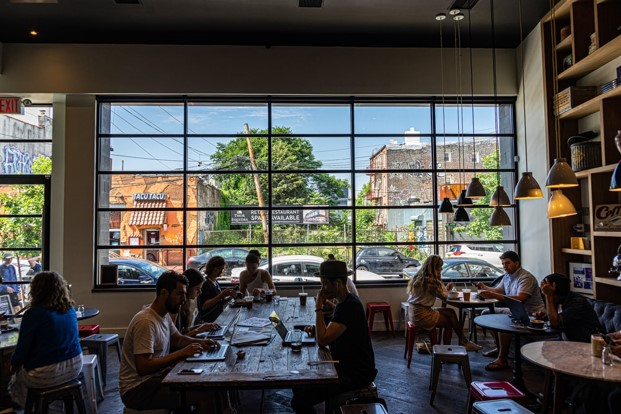

In [8]:
import cv2
from google.colab.patches import cv2_imshow

# Carregando a imagem

image = cv2.imread(nome_imagem)
print("Altura:",image.shape[0])
print("Largura:",image.shape[1])
print("Canais:",image.shape[2])
cv2.imwrite('Imagem1_cv2.jpg',image)
cv2_imshow(image)

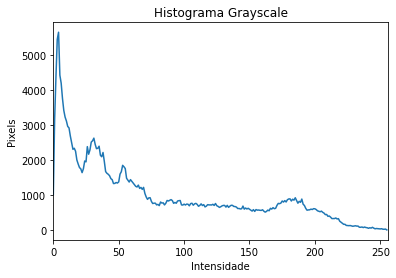

In [9]:
from matplotlib import pyplot as plt 

# Calculando o Histograma  de uma imagem
image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY) 
# Calcula o histograma
hist = cv2.calcHist([image_gray], [0], None, [256], [0, 256]) 
# Histograma
plt.figure() 
plt.title("Histograma Grayscale") 
plt.xlabel("Intensidade") 
plt.ylabel("Pixels") 
plt.plot(hist) 
plt.xlim([0, 256]) 
plt.show() 

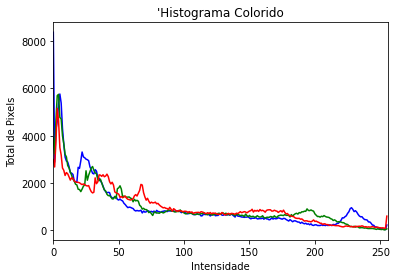

In [10]:
# Histograma colorido
canais = cv2.split(image) 
cores = ("b", "g", "r") 
plt.figure() 
plt.title("'Histograma Colorido") 
plt.xlabel("Intensidade") 
plt.ylabel("Total de Pixels") 
for (canal, cor) in zip(canais, cores):
	hist = cv2.calcHist([canal], [0], None, [256], [0, 256]) 
	plt.plot(hist, color = cor) 
	plt.xlim([0, 256]) 
plt.show()

Azul: (414, 621)
Verde: (414, 621)
Vermelho: (414, 621)


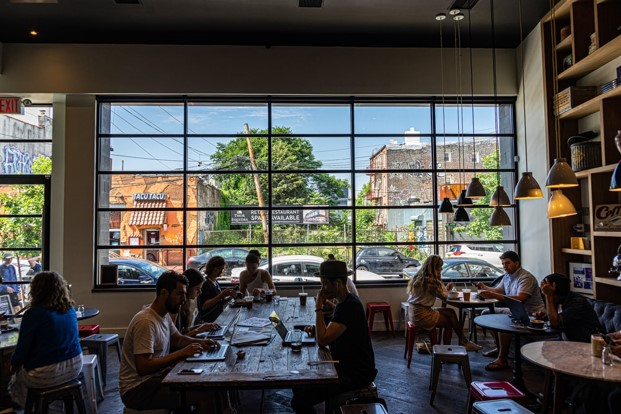

In [11]:
# Como a imagem é tratada como uma matriz, podemos tratar cada matriz de cor em separado
b,g,r = cv2.split(image)
print('Azul:',b.shape)
print('Verde:',g.shape)
print('Vermelho:',r.shape)
img_merged = cv2.merge((b,g,r))
cv2_imshow(img_merged)

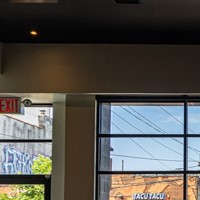

In [12]:
# Uma imagem é um array numpy
# Cortando uma imagem através da matriz numpy 
canto = image[0:200, 0:200]
cv2_imshow(canto)

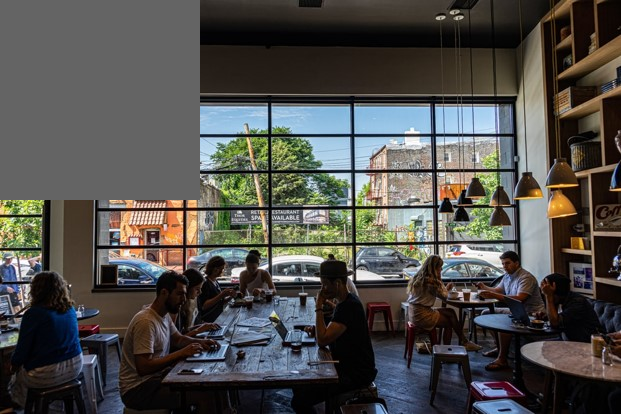

In [13]:
# Mudamos o canto superior esquerdo para cinza
image[0:200, 0:200] = (100, 100, 100)

# Mostra a imagem
cv2_imshow(image)

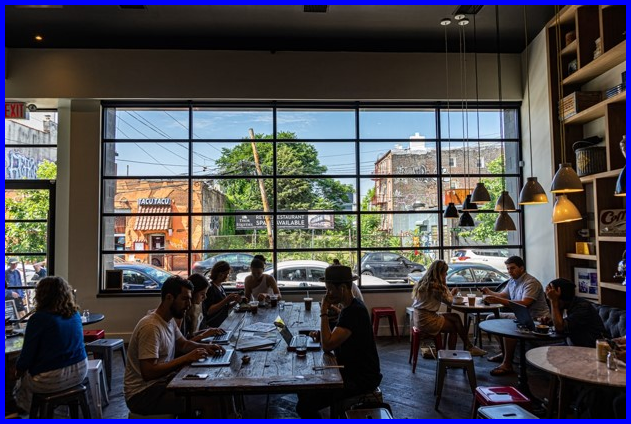

In [14]:
# Vamos utilizar uma função do OpenCV para criar uma borda
BLUE = (255,0,0)
image = cv2.imread(nome_imagem)
img_borda = cv2.copyMakeBorder(image,5,5,5,5,cv2.BORDER_CONSTANT,value=BLUE)
cv2_imshow(img_borda)

Dimensões Originais: (5472, 3648, 3)
Dimensões Resized: (547, 364, 3)


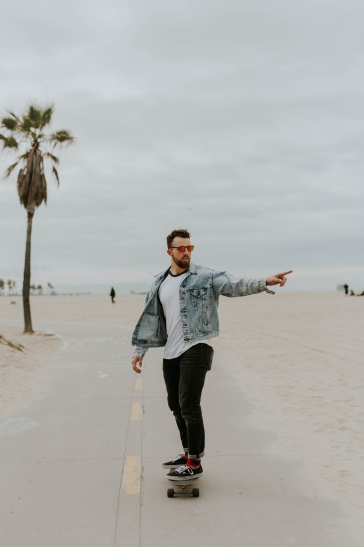

In [15]:
# Redimensionando uma imagem
img = cv2.imread('skate.jpg')
print('Dimensões Originais:',img.shape)
scale_percent = 10 
width = int(img.shape[1] * scale_percent / 100)
height = int(img.shape[0] * scale_percent / 100)
dim = (width, height)
# Resize diminuindo o tamanho
resized = cv2.resize(img, dim, interpolation = cv2.INTER_AREA)
print('Dimensões Resized:',resized.shape)
cv2_imshow(resized)

Dimensões Resized: (1094, 728, 3)


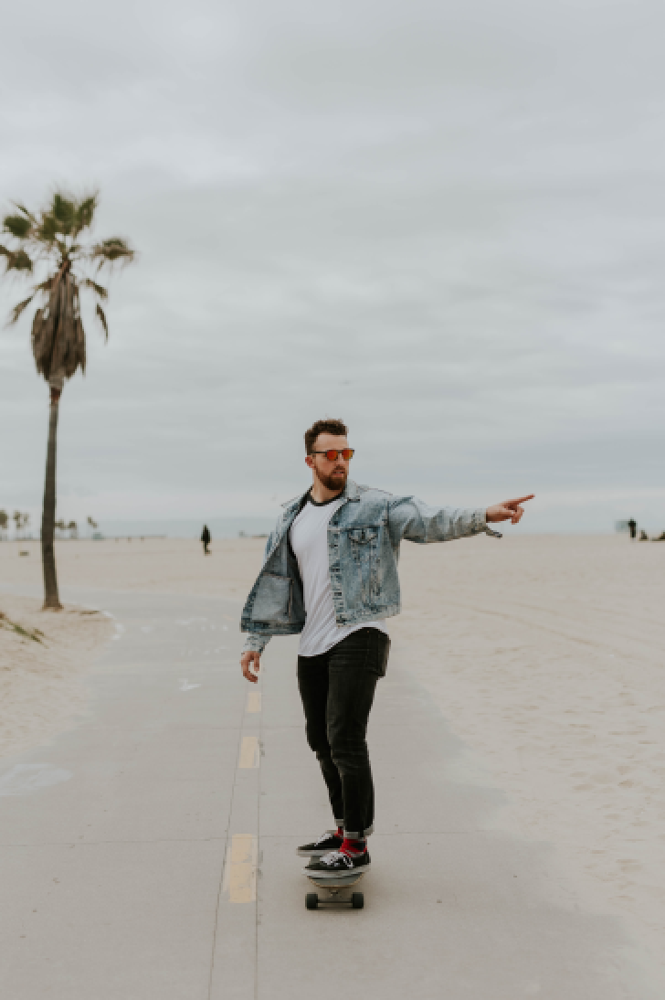

In [16]:
# Resize aumentando o tamanho
resize_scale = 2
width = int(resized.shape[1] * resize_scale)
height = int(resized.shape[0] * resize_scale)
dim = (width, height)
resized2 = cv2.resize(resized, dim, interpolation = cv2.INTER_AREA)
print('Dimensões Resized:',resized2.shape)
cv2_imshow(resized2)

Dimensões Originais: (414, 621, 3)
Dimensões Resized: (400, 600, 3)


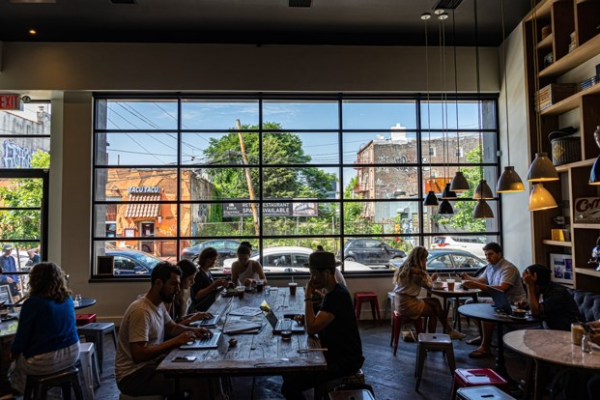

In [17]:
# Função para diminuir o tamanho 
def rezise_to_height(img, height):
  print('Dimensões Originais:',img.shape)
  width = int(height * img.shape[1] / img.shape[0])
  resized = cv2.resize(img, (width, height), interpolation = cv2.INTER_AREA)
  print('Dimensões Resized:',resized.shape)
  return resized
resized = rezise_to_height(image, 400)
cv2_imshow(resized)

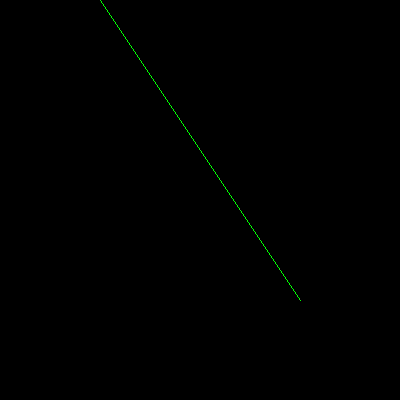

In [18]:
# Desenhando na imagem
import numpy as np
img3 = np.zeros((400, 400, 3), dtype = "uint8")

# Linha
cv2.line(img3, (100, 0), (300, 300), (0, 255, 0))
cv2_imshow(img3)

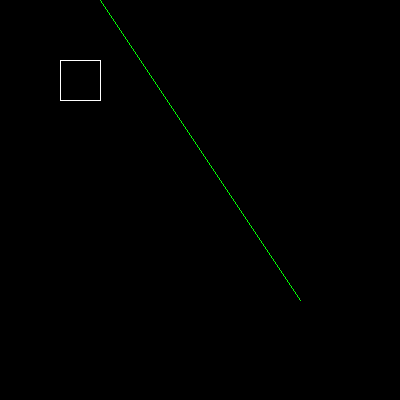

In [19]:
# Quadrado
cv2.rectangle(img3, (100, 100), (60, 60), (255,255,255))
cv2_imshow(img3)

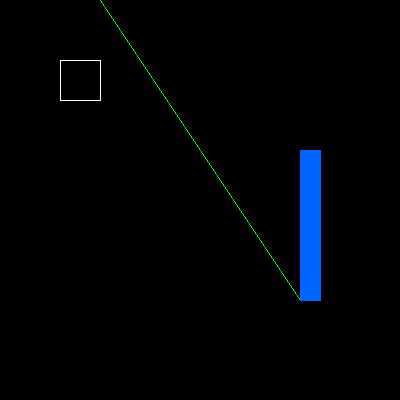

In [20]:
# Retângulo preenchido
cv2.rectangle(img3, (320, 150), (300, 300), (255, 100, 0), -1)
cv2_imshow(img3)

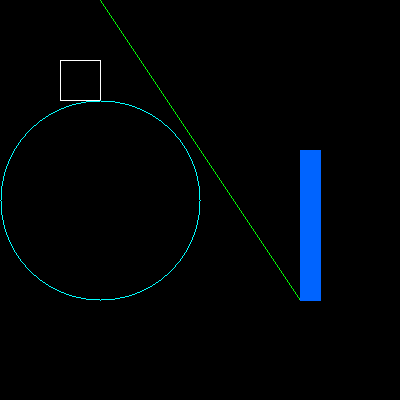

In [21]:
# Círculo
cv2.circle(img3, (100, 200), 100, (255,255,0))
cv2_imshow(img3)

(414, 621)
310 207


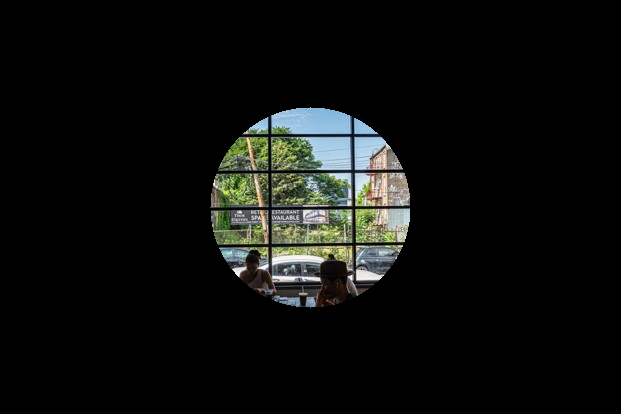

In [22]:
# Aplicando uma máscara a partir de um desenho
mask = np.zeros(image.shape[:2], dtype = "uint8")
print(mask.shape)
# Calculando o centro da imagem
(cX, cY) = (image.shape[1] // 2, image.shape[0] // 2)
print(cX, cY)
# Agora, vamos fazer uma máscara circular com um raio de 100 pixels
cv2.circle(mask, (cX, cY), 100, 255, -1)
masked = cv2.bitwise_and(image, image, mask = mask)
cv2_imshow(masked)

Dimensões Originais: (762, 620, 3)
Dimensões Resized: (400, 325, 3)
Dimensões Originais: (414, 621, 3)
Dimensões Resized: (400, 600, 3)
Shape image_resized: (400, 325, 3)


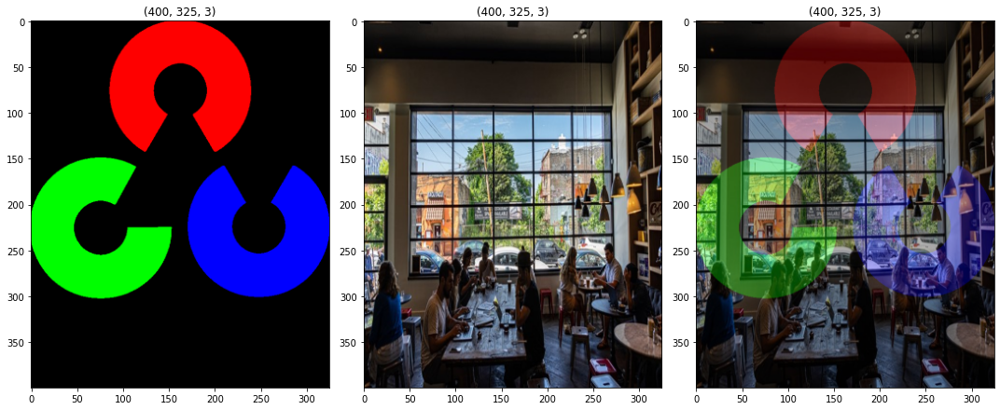

In [23]:
import matplotlib.pyplot as plt
import numpy as np

# Vamos realizar uma mistura de imagens (Image Blending)
img_cv_logo = cv2.imread('opencv-logo.png')
image = cv2.imread(nome_imagem)

# Mudando o tamanho das imagens para ficarem com a mesma altura
img_cv_logo = rezise_to_height(img_cv_logo, 400)
image_resized = rezise_to_height(image, 400)

# Cortando a segunda imagem para ficar com a mesma largura
image_resized = cv2.resize(image_resized, (325, 400))
print(f'Shape image_resized: {image_resized.shape}')

# Juntando as duas imagens
image_blended = cv2.addWeighted(image_resized,0.7,img_cv_logo,0.3,0)

# Plotando tudo
fig, (ax1, ax2, ax3) = plt.subplots(nrows=1, ncols=3, figsize=(15, 8))
ax1.imshow(cv2.cvtColor(img_cv_logo, cv2.COLOR_BGR2RGB))
ax1.set_title(img_cv_logo.shape)
ax2.imshow(cv2.cvtColor(image_resized, cv2.COLOR_BGR2RGB))
ax2.set_title(image_resized.shape)
ax3.imshow(cv2.cvtColor(image_blended, cv2.COLOR_BGR2RGB))
ax3.set_title(image_blended.shape)
plt.tight_layout()
plt.show()

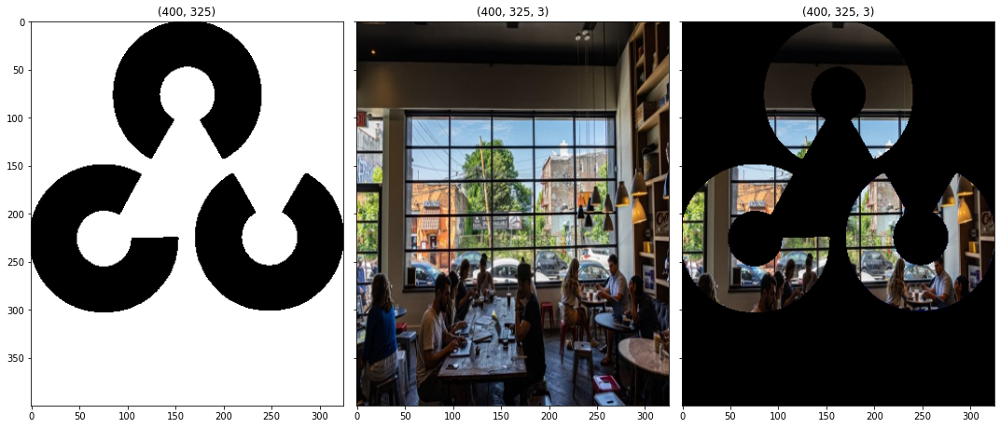

In [24]:
# Realizando uma operação Bitwise (bit a bit)

# Criando uma máscara do logo
img2gray = cv2.cvtColor(img_cv_logo,cv2.COLOR_BGR2GRAY)
ret, mask = cv2.threshold(img2gray, 10, 255, cv2.THRESH_BINARY)
mask_inv = cv2.bitwise_not(mask)
# Tornando o logo com fundo preto
rows,cols,channels = image_resized.shape
roi = img_cv_logo[0:rows, 0:cols ]
img1_bg = cv2.bitwise_and(roi,roi,mask = mask_inv)
# Pegando apenas a região do logo da imagem
img2_fg = cv2.bitwise_and(image_resized,image_resized,mask = mask)
dst = cv2.add(img1_bg,img2_fg)

# Plotando tudo
fig, (ax1, ax2, ax3) = plt.subplots(nrows=1, ncols=3, figsize=(15, 8),
                                    sharex=True, sharey=True)
ax1.imshow(cv2.cvtColor(mask_inv, cv2.COLOR_BGR2RGB))
ax1.set_title(mask_inv.shape)
ax2.imshow(cv2.cvtColor(image_resized, cv2.COLOR_BGR2RGB))
ax2.set_title(image_resized.shape)
ax3.imshow(cv2.cvtColor(dst, cv2.COLOR_BGR2RGB))
ax3.set_title(dst.shape)
plt.tight_layout()
plt.show()

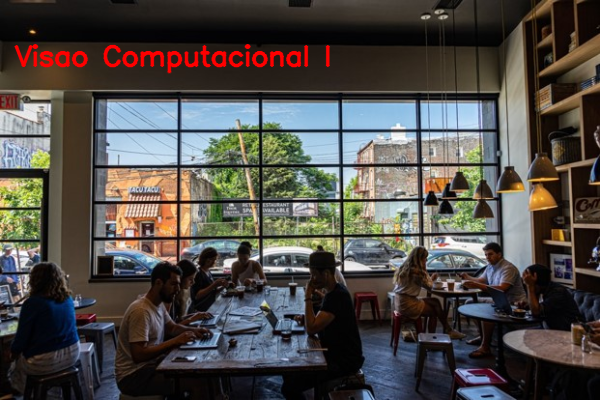

In [25]:
# Escrevendo na imagem
image = np.copy(resized)
font = cv2.FONT_HERSHEY_SIMPLEX 
cv2.putText(image,'Visao Computacional I',(15,65), font, 0.9,(0,0,255),2,cv2.LINE_AA)
cv2_imshow(image) 

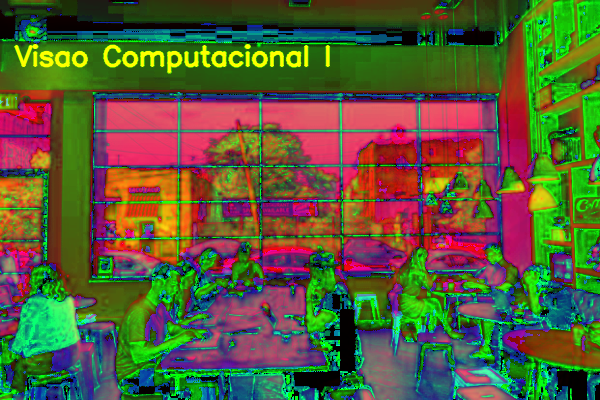

In [26]:
# Operações de cor

hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
cv2_imshow(hsv) 

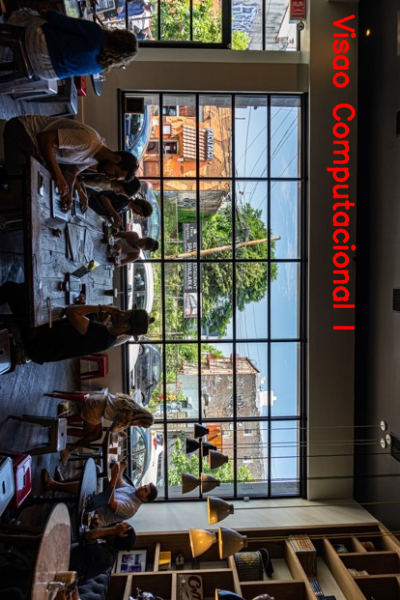

In [27]:
# Rotacionando
rotated = cv2.rotate(image, cv2.ROTATE_90_CLOCKWISE) 
cv2_imshow(rotated)

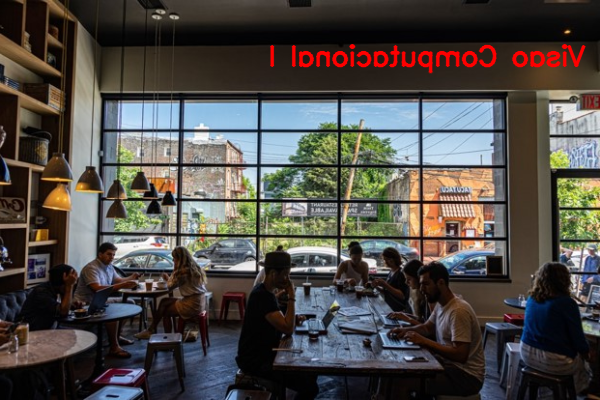

In [28]:
# Realizando a operação flip  (giro) 

# Flip (giro) horizontal
flipped = cv2.flip(image, 1)
cv2_imshow(flipped)

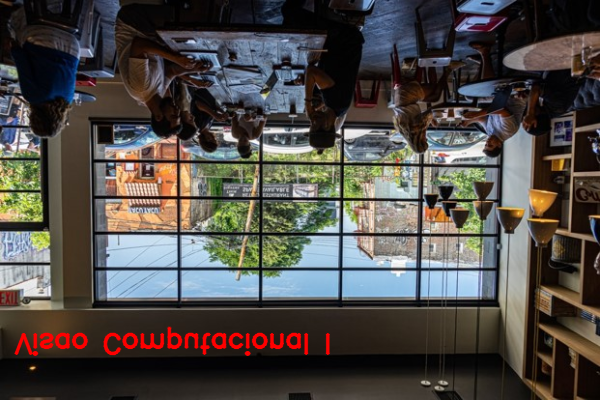

In [29]:
# Flip (giro) vertical
flipped = cv2.flip(image, 0)
cv2_imshow(flipped)

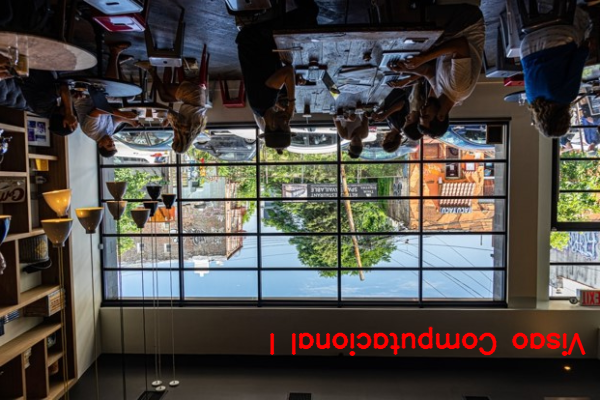

In [30]:
# Flip (giro) horizontal e vertical
flipped = cv2.flip(image, -1)
cv2_imshow(flipped)

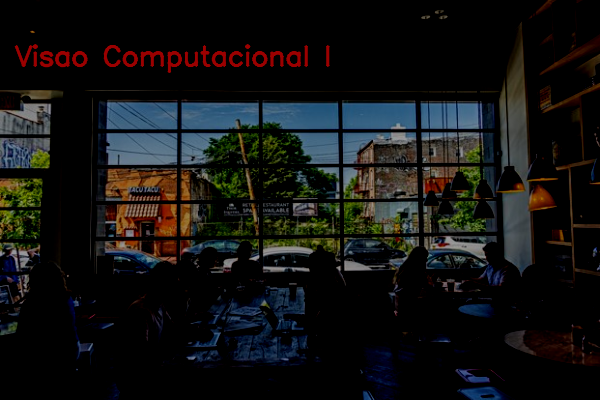

In [31]:
# Subtraindo valor em matriz
M = np.ones(image.shape, dtype = "uint8") * 100
subtracted = cv2.subtract(image, M)
cv2_imshow(subtracted)

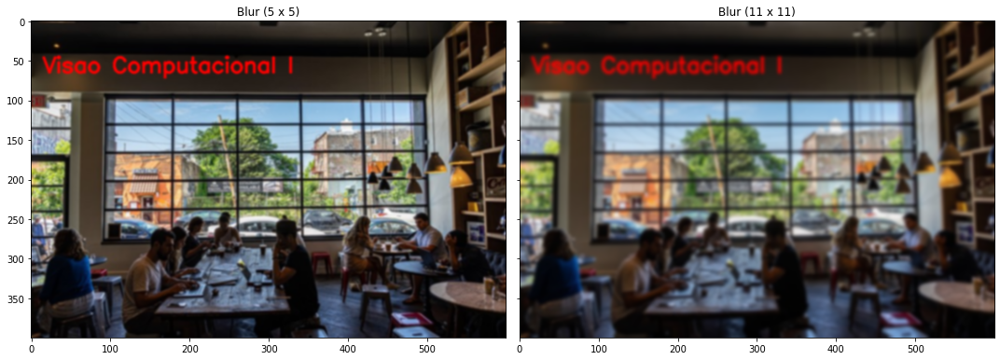

In [32]:
# Utilizando o filtro Blur (deve ser número ímpar)
blur_5_x_5 = cv2.GaussianBlur(image,(5,5),0)
blur_11_x_11 = cv2.GaussianBlur(image,(11,11),0)

# Plotando tudo
fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(15, 8),
                                    sharex=True, sharey=True)
ax1.imshow(cv2.cvtColor(blur_5_x_5, cv2.COLOR_BGR2RGB))
ax1.set_title('Blur (5 x 5)')
ax2.imshow(cv2.cvtColor(blur_11_x_11, cv2.COLOR_BGR2RGB))
ax2.set_title('Blur (11 x 11)')
plt.tight_layout()
plt.show()

# Exercício 3.1

Consulte a página de documentação: https://docs.opencv.org/4.1.2/d4/d13/tutorial_py_filtering.html

Crie uma linha abaixo para experimentar as seguintes funções na imagem street.jpg:

* cv2.medianBlur
* cv2.bilateralFilter

Imprima na tela os resultados

#### Median blur

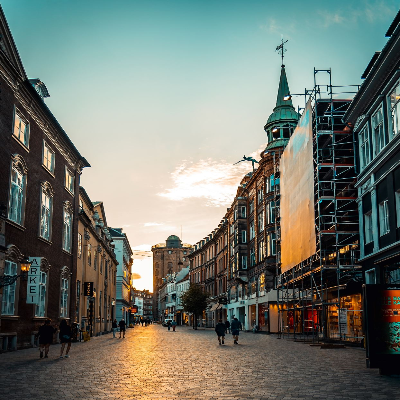

In [33]:
street = cv2.imread('street.jpg')
street = cv2.resize(street, (400, 400))
cv2_imshow(street)

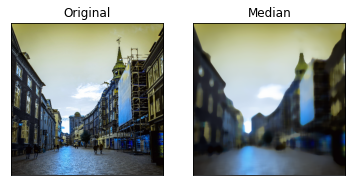

In [34]:
median = cv2.medianBlur(street, 15)

plt.subplot(121),plt.imshow(street),plt.title('Original')
plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(median),plt.title('Median')
plt.xticks([]), plt.yticks([])
plt.show()

#### Bilateral filter

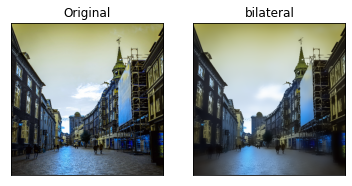

In [35]:
bilateral = cv2.bilateralFilter(street, 20, 100, 100)

plt.subplot(121),plt.imshow(street),plt.title('Original')
plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(bilateral),plt.title('bilateral')
plt.xticks([]), plt.yticks([])
plt.show()

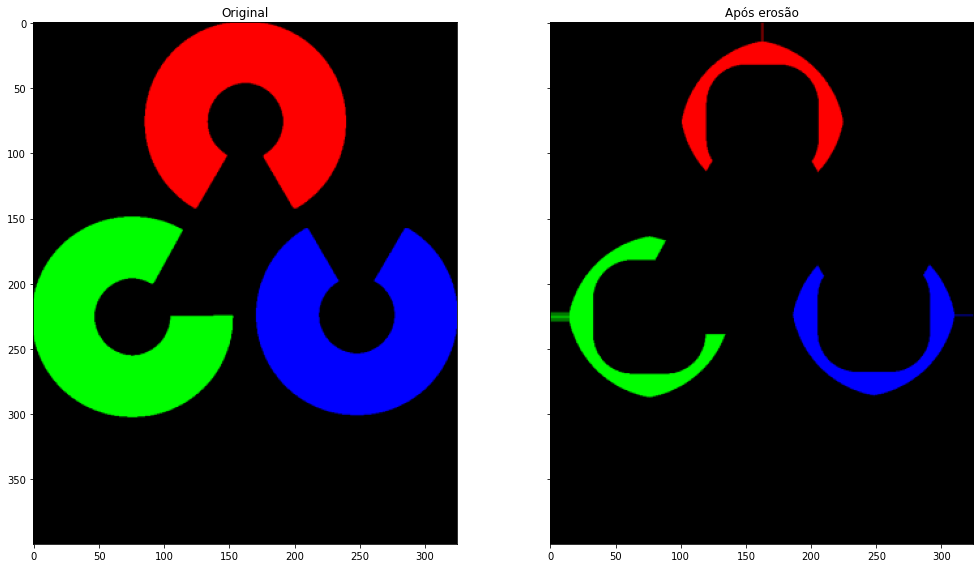

In [36]:
# Utilizando a erosão

kernel = np.ones((5,5),np.uint8)
erosion = cv2.erode(img_cv_logo,kernel,iterations = 7)

# Plotando tudo
fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(15, 8),
                                    sharex=True, sharey=True)
ax1.imshow(cv2.cvtColor(img_cv_logo, cv2.COLOR_BGR2RGB))
ax1.set_title('Original')
ax2.imshow(cv2.cvtColor(erosion, cv2.COLOR_BGR2RGB))
ax2.set_title('Após erosão')
plt.tight_layout()
plt.show()

Dimensões Originais: (5472, 3648, 3)
Dimensões Resized: (400, 266, 3)


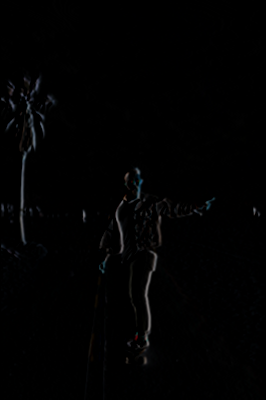

In [37]:
# Encontrando bordas com Sobel
# Ref: https://docs.opencv.org/4.1.2/d4/d86/group__imgproc__filter.html#gacea54f142e81b6758cb6f375ce782c8d
img = cv2.imread('skate.jpg')
img_skate = rezise_to_height(img, 400)
# Desfocando antes de utilizar a detecção de borda
img_blurred = cv2.GaussianBlur(img_skate, (3, 3), 0)
sobel = cv2.Sobel(img_blurred, cv2.CV_64F , 1 , 0 , ksize=1 )
cv2_imshow(sobel)

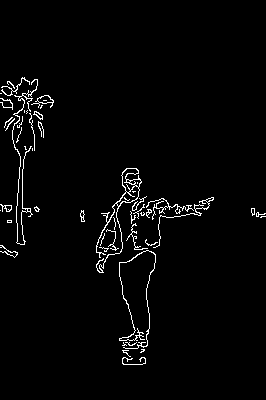

In [38]:
# Encontrando bordas com Canny
# Ref: https://docs.opencv.org/4.1.2/dd/d1a/group__imgproc__feature.html#ga2a671611e104c093843d7b7fc46d24af
img_blurred = cv2.GaussianBlur(img_skate, (3, 3), 0)
edges = cv2.Canny(img_blurred,100,200)
cv2_imshow(edges)

Desfocada


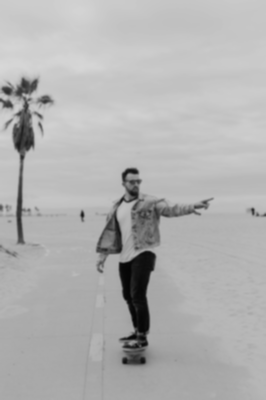

Original


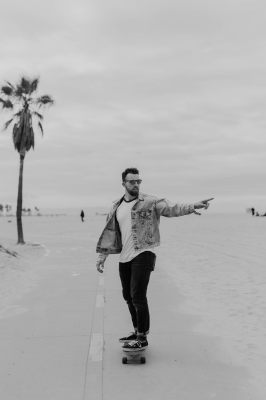

89 contornos encontrados


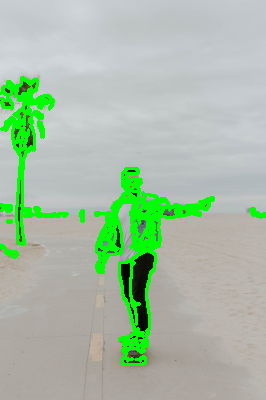

In [39]:
# Encontrando contornos

# Converte para escala de cinza
img_gray = cv2.cvtColor(img_skate, cv2.COLOR_BGR2GRAY)
# Desfocagem primeiro para buscar contornos
img_blurred = cv2.GaussianBlur(img_gray, (3, 3), 0)
print('Desfocada')
cv2_imshow(img_blurred)
edged = cv2.Canny(img_blurred, 30, 150)
# Imagem original
print('Original')
cv2_imshow(img_gray)
 # Encontra contornos
contours, hierarchy = cv2.findContours(edged.copy(), cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)
# Desenha os contornos
img_skate_contours = np.copy(img_skate)
cv2.drawContours(img_skate_contours, contours, -1, (0, 255, 0), 2)
print(len(contours),'contornos encontrados')
cv2_imshow(img_skate_contours)

# Exercício 3.2

Consulte as funções documentadas em https://docs.opencv.org/4.1.2/d9/d61/tutorial_py_morphological_ops.html

Procure uma imagem que contenha um texto escrito com ruído (procure por 'text with noise' na Web e carregue a imagem na pasta 'processamento_imagens')

Realize transformações e filtros para melhorar e mostre o resultado

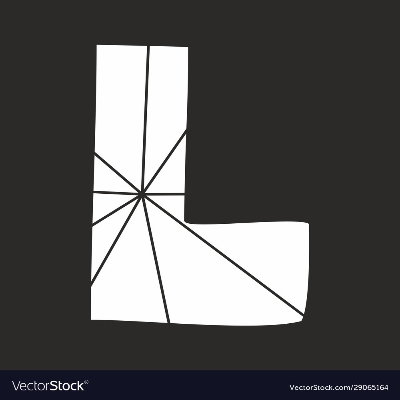

In [40]:
noise = cv2.imread('noise.jpg')
noise = cv2.resize(noise, (400, 400))
cv2_imshow(noise)

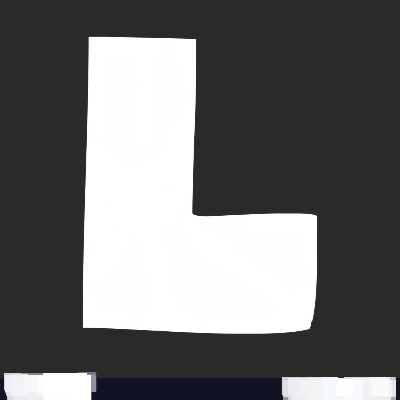

In [42]:
kernel = np.ones((5, 5), np.uint8)
img_dilation = cv2.dilate(noise, kernel, iterations=4) 
closing = cv2.morphologyEx(img_dilation, cv2.MORPH_CLOSE, kernel)
cv2_imshow(closing)

Face


Encontrando a face  em grayscale


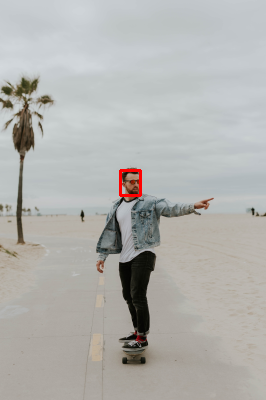

In [43]:
# Template matching
# Ref: https://docs.opencv.org/4.1.2/d4/dc6/tutorial_py_template_matching.html
img_skate_template = np.copy(img_skate)
img_template = img_skate_template[170:195,120:140]
img_template = cv2.cvtColor(img_template, cv2.COLOR_BGR2GRAY)
print('Face')
cv2_imshow(img_template)

img_gray = cv2.cvtColor(img_skate_template, cv2.COLOR_BGR2GRAY)
w, h = img_template.shape[::-1]
res = cv2.matchTemplate(img_gray, img_template, cv2.TM_CCOEFF_NORMED)
threshold = 0.8
loc = np.where( res >= threshold)
for pt in zip(*loc[::-1]):
    cv2.rectangle(img_skate_template, pt, (pt[0] + w, pt[1] + h), (0,0,255), 1)
print('Encontrando a face  em grayscale')
cv2_imshow(img_skate_template)

# Exercício 3.3

Seguindo o exemplo mostrado no final da página https://docs.opencv.org/4.1.2/d4/dc6/tutorial_py_template_matching.html com o jogo Mario, encontre uma imagem na Web que possua objetos iguais sendo exibidos e faça o download dessa imagem

Corte um dos objetos para servir de template

Em seguida, busque e plote todos os objetos encontrados a partir do template, assim como foi feito no exemplo para o jogo Mario

Dica: Lembre-se que as imagens e o recorte devem ser transformados para Grayscale para a busca por template funcionar


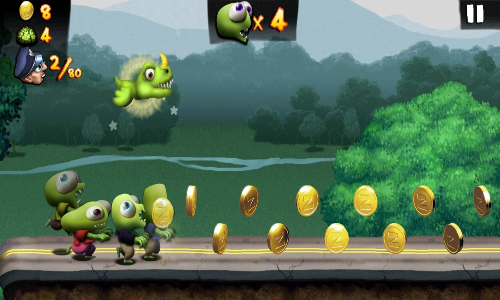

In [44]:
zumbi = cv2.imread('zumbi.jpg')
zumbi = cv2.resize(zumbi, (500, 300))
cv2_imshow(zumbi)

Zumbi


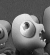

Encontrando a face do Zumbi


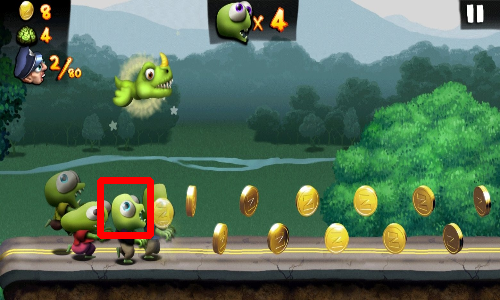

In [89]:
img_rgb = np.copy(zumbi)
img_gray = cv2.cvtColor(img_rgb, cv2.COLOR_BGR2GRAY)

template = img_zumbi_template[180:235, 100:150]
template = cv2.cvtColor(template, cv2.COLOR_BGR2GRAY)
print('Zumbi')
cv2_imshow(template)

w, h = template.shape[::-1]
res = cv2.matchTemplate(img_gray, template, cv2.TM_CCOEFF_NORMED)
threshold = 0.8
loc = np.where(res >= threshold)

for pt in zip(*loc[::-1]):
    cv2.rectangle(img_rgb, pt, (pt[0] + w, pt[1] + h), (0, 0, 255), 2)

print('Encontrando a face do Zumbi')
cv2_imshow(img_rgb)

Dimensões Originais: (170, 296, 3)
Dimensões Resized: (500, 870, 3)


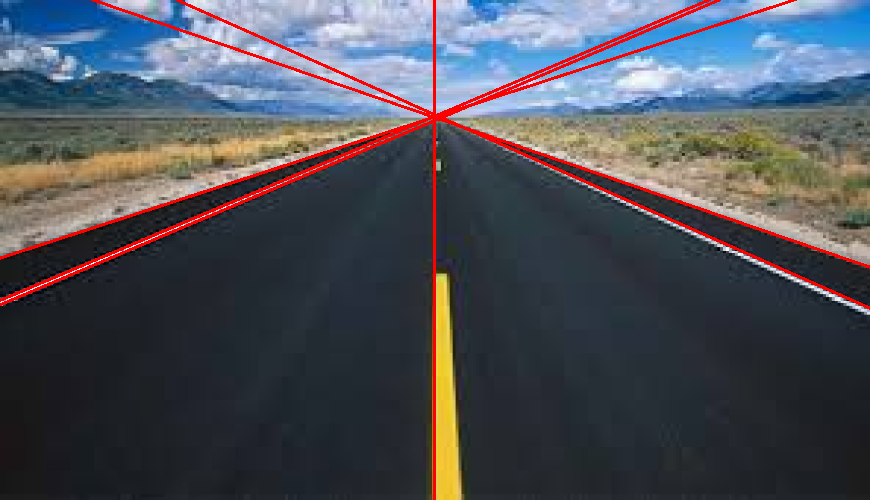

In [90]:
# Encontrando e plotando as linhas de meio fio em uma estrada

img_street = cv2.imread('road.jpg')
img_street = rezise_to_height(img_street,500)
img_street_lines = np.copy(img_street)

gray = cv2.cvtColor(img_street,cv2.COLOR_BGR2GRAY)
edges = cv2.Canny(gray, 170, 200 ,apertureSize = 3) # Varie os valores para identificar
lines = cv2.HoughLines(edges,1,np.pi/180,200)

# Plotando as linhas
for line in lines:
    rho,theta = line[0]
    a = np.cos(theta)
    b = np.sin(theta)
    x0 = a*rho
    y0 = b*rho
    x1 = int(x0 + 1000*(-b))
    y1 = int(y0 + 1000*(a))
    x2 = int(x0 - 1000*(-b))
    y2 = int(y0 - 1000*(a))
    cv2.line(img_street_lines,(x1,y1),(x2,y2),(0,0,255),2)

# Mostrando a imagem    
cv2_imshow(img_street_lines)

# Exercício 3.4

Ref: https://docs.opencv.org/4.1.2/d6/d10/tutorial_py_houghlines.html

Encontre uma imagem na Web onde seja interessante identificar as linhas (explique o motivo)

Carregue a imagem na pasta 'processamento_imagens', identifique as linhas e plote mostrando o resultado


#### Imagem: Porta
#### Motivo: Para definir o contorno do objeto na imagem e demarcar limites.

Dimensões Originais: (501, 334, 3)
Dimensões Resized: (500, 333, 3)


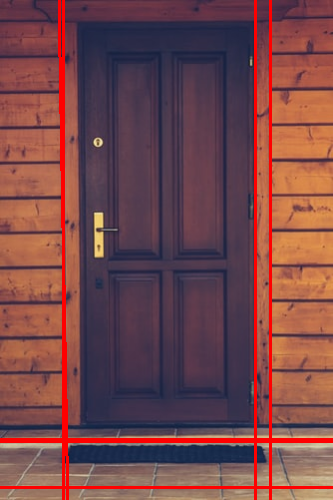

In [120]:
img_door = cv2.imread('door.jpeg')
img_door = rezise_to_height(img_door, 500)
img_door_lines = np.copy(img_door)

gray = cv2.cvtColor(img_door, cv2.COLOR_BGR2GRAY)
edges = cv2.Canny(gray, 50, 150, apertureSize=3)
lines = cv2.HoughLines(edges, 1, np.pi/180, 200)

for line in lines:
    rho, theta = line[0]
    a = np.cos(theta)
    b = np.sin(theta)
    x0 = a*rho
    y0 = b*rho
    x1 = int(x0 + 1000*(-b))
    y1 = int(y0 + 1000*(a))
    x2 = int(x0 - 1000*(-b))
    y2 = int(y0 - 1000*(a))
    cv2.line(img_door_lines,(x1,y1),(x2,y2),(0,0,255), 2)
 
cv2_imshow(img_door_lines)

# Exercício 3.5

Seguindo o exemplo mostrado em https://docs.opencv.org/4.1.2/da/d53/tutorial_py_houghcircles.html

Encontre uma imagem na internet que seja interessante identificar círculos. 

Baixe a imagem e identifique os círculos

Dimensões Originais: (500, 750)
Dimensões Resized: (400, 600)


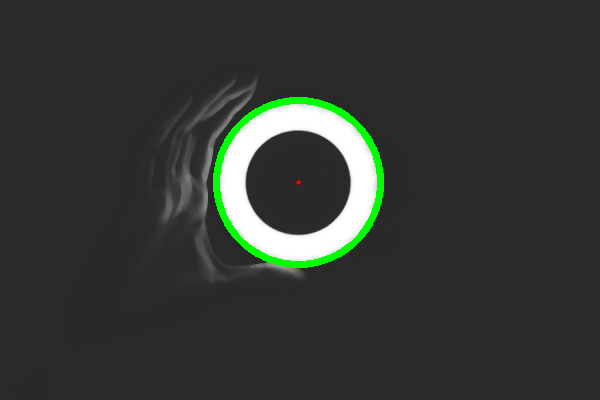

In [209]:
img = cv2.imread('circle.jpeg', 0)
img = rezise_to_height(img, 400)
img = cv2.medianBlur(img, 5)
cimg = cv2.cvtColor(img, cv2.COLOR_GRAY2BGR)

circles = cv2.HoughCircles(img, cv2.HOUGH_GRADIENT, 1, 100, param1=50, param2=30, minRadius=0, maxRadius=0)
circles = np.uint16(np.around(circles))

for i in circles[0,:]:
    cv2.circle(cimg, (i[0], i[1]), i[2], (0, 255, 0), 5)
    cv2.circle(cimg, (i[0], i[1]), 2, (0, 0, 255), -1)
cv2_imshow(cimg)

Imagem original


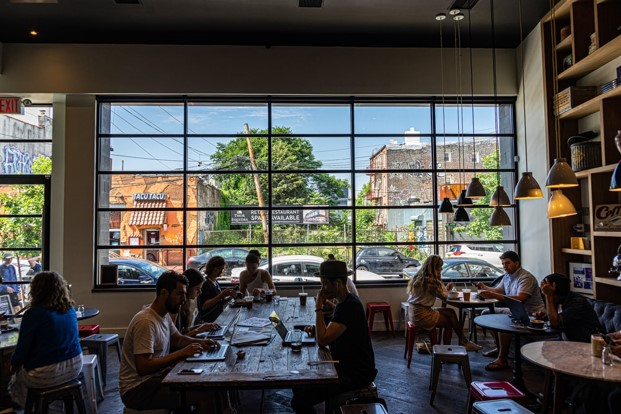

Imagem sem ruído


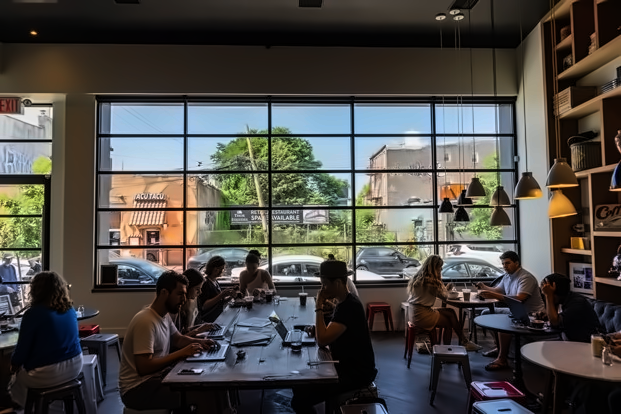

In [210]:
# Denoising (Removendo Ruídos)
# Verificando o comportamento
image = cv2.imread(nome_imagem)

print('Imagem original')
cv2_imshow(image)

print('Imagem sem ruído')
img_denoised = cv2.fastNlMeansDenoisingColored(image, None, 10, 10, 7, 21)
cv2_imshow(img_denoised)

# Exercício 3.6

Consulte as funções mostradas em https://docs.opencv.org/4.1.2/d5/d69/tutorial_py_non_local_means.html

Encontre uma imagem na internet que necessite de remoção de ruído e utilize uma das funções para reduzir esse ruído e mostre a imagem original e o resultado após a aplicação da função. 

Imagem original


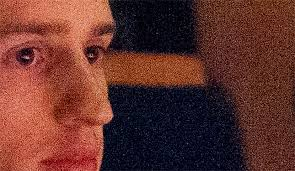

Imagem sem ruído


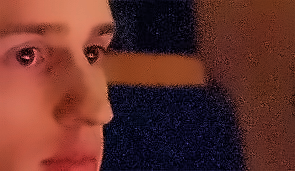

In [214]:
image = cv2.imread('imagem_com_ruido.jpeg')

print('Imagem original')
cv2_imshow(image)

print('Imagem sem ruído')
img_denoised = cv2.fastNlMeansDenoisingColored(image, None, 15, 10, 7, 21)
cv2_imshow(img_denoised)

# Exercício 3.7

# Consulte as funções abaixo e explique onde poderiam ser úteis em aplicações reais:

a) https://docs.opencv.org/4.1.2/d4/d8c/tutorial_py_shi_tomasi.html

b) https://docs.opencv.org/4.1.2/df/d3d/tutorial_py_inpainting.html

Busque uma imagem da Web e execute a função para demonstrar seu funcionamento.


#### Image Inpainting: pode ser aplicado para restauração de fotos antigas.

Imagem original


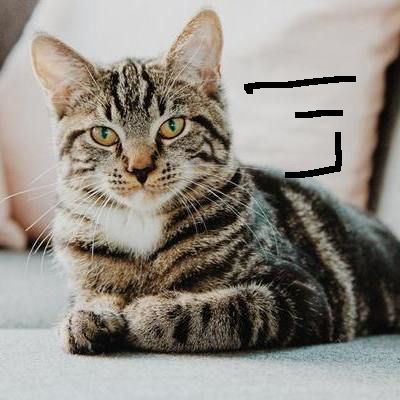

Imagem restaurada


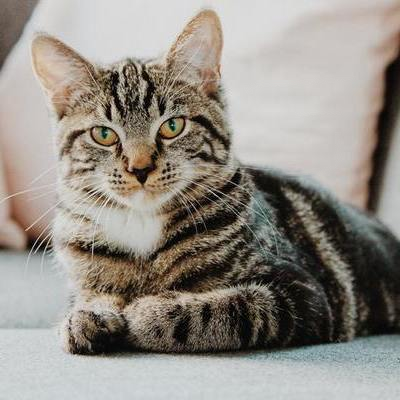

In [220]:
image_2 = cv2.imread('cat_damaged.png')
print('Imagem original')
cv2_imshow(image_2)

print('Imagem restaurada')
mask = cv2.imread('cat_mask.png', 0)
img_restored = cv2.inpaint(image_2, mask, 3, cv2.INPAINT_TELEA)
cv2_imshow(img_restored)

#### Corner Detector: aplicado para demarcação de limites.

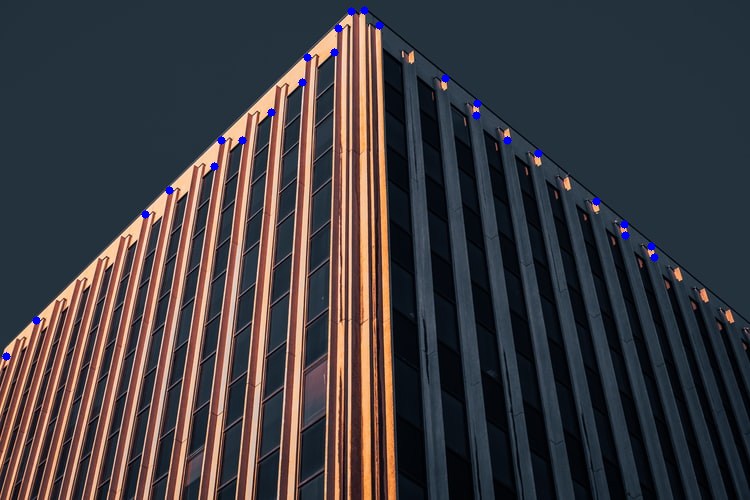

In [230]:
img = cv2.imread('corner.jpeg')
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
corners = cv2.goodFeaturesToTrack(gray, 25, 0.01, 10)
corners = np.int0(corners)
  
for i in corners:
    x,y = i.ravel()
    cv2.circle(img, (x,y), 4, 255, -1)

cv2_imshow(img)

FIM